# Load the data

In [122]:
import pandas
import numpy
import sys
%matplotlib inline
import matplotlib.pyplot as plt
from pandas.tools.plotting import scatter_matrix
import seaborn as sns
import numpy as np
import time
from sklearn import metrics
from sklearn import cross_validation
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')
# fix random seed for reproducibility
plt.rcParams['figure.figsize'] = (15, 6)

In [123]:
# fix random seed for reproducibility
seed = 7
numpy.random.seed(seed)
plt.rcParams['figure.figsize'] = (15, 6)
url1 = "http://archive.ics.uci.edu/ml/machine-learning-databases/poker/poker-hand-training-true.data"
names=['S1', 'C1', 'S2', 'C2', 'S3', 'C3','S4', 'C4', 'S5', 'C5', 'CLASS']
url2 = "http://archive.ics.uci.edu/ml/machine-learning-databases/poker/poker-hand-testing.data"
data = pandas.read_csv('poker-hand-training-true.data.txt', names=names)
test = pandas.read_csv('poker-hand-testing.data.txt', names=names)

data = data.sample(20000)
test = test.sample(1000)
peek = data.head(10)
print(peek)
print('===============================================')
peektest = test.head(10)
print(peektest)

       S1  C1  S2  C2  S3  C3  S4  C4  S5  C5  CLASS
17390   2  12   2   3   4   3   3   3   1   5      3
10694   2   9   3   8   2   8   4  10   4   3      1
23373   3   8   2  12   1   1   1   6   4  11      0
8727    4   9   4  12   3  12   4   7   2  11      1
18150   1   6   4   4   3  10   2  13   1  11      0
12544   2   3   2  12   3   9   1  13   4  11      0
24838   2   6   2  12   2  13   3  12   4   8      1
2750    4  11   4  10   1   4   2   7   2  11      1
9045    1   7   4   9   2   3   4  11   2   1      0
21399   4   4   3   3   2  11   3   4   2   3      2
        S1  C1  S2  C2  S3  C3  S4  C4  S5  C5  CLASS
179065   3  12   2  12   2  10   2   4   1   3      1
761669   4  13   1   6   2   7   3  13   3   7      2
870926   1  11   4   2   2   6   1   3   3   1      0
725302   2  10   3  11   4   2   4   4   4   8      0
396312   2   2   3  12   3  11   1  10   4   7      0
943619   2   2   3   7   2   1   4   2   4  10      1
445734   4  13   2  11   3   5   2  10 

In [124]:
shape = data.shape
print(shape)

(20000, 11)


In [125]:
types = data.dtypes
print(types)

S1       int64
C1       int64
S2       int64
C2       int64
S3       int64
C3       int64
S4       int64
C4       int64
S5       int64
C5       int64
CLASS    int64
dtype: object


In [126]:
pandas.set_option('display.width', 100)
pandas.set_option('precision', 3)
description = data.describe()
print(description)

              S1         C1         S2         C2         S3         C3         S4         C4  \
count  20000.000  20000.000  20000.000  20000.000  20000.000  20000.000  20000.000  20000.000   
mean       2.503      6.991      2.491      7.041      2.514      7.032      2.496      6.931   
std        1.117      3.754      1.124      3.763      1.124      3.744      1.115      3.739   
min        1.000      1.000      1.000      1.000      1.000      1.000      1.000      1.000   
25%        2.000      4.000      1.000      4.000      2.000      4.000      2.000      4.000   
50%        3.000      7.000      2.000      7.000      3.000      7.000      2.000      7.000   
75%        4.000     10.000      4.000     10.000      4.000     10.000      3.000     10.000   
max        4.000     13.000      4.000     13.000      4.000     13.000      4.000     13.000   

              S5         C5      CLASS  
count  20000.000  20000.000  20000.000  
mean       2.496      6.972      0.620  
std

In [127]:
class_counts = data.groupby('CLASS').size()
print ('Classes on training data')
print(class_counts)

Classes on training data
CLASS
0    10024
1     8439
2      961
3      418
4       75
5       44
6       25
7        6
8        3
9        5
dtype: int64


In [128]:
class_counts = test.groupby('CLASS').size()
print ('Classes on testing data')
print(class_counts)

Classes on testing data
CLASS
0    466
1    466
2     39
3     22
4      4
5      1
6      2
dtype: int64


In [129]:
correlations = data.corr(method='pearson')
print(correlations)

          S1     C1         S2         C2     S3     C3     S4     C4     S5     C5  CLASS
S1     1.000 -0.017 -1.683e-02  3.752e-03 -0.017 -0.008 -0.018  0.004 -0.019  0.011  0.009
C1    -0.017  1.000  6.849e-03 -6.943e-03 -0.001 -0.017  0.007 -0.019  0.007 -0.014  0.004
S2    -0.017  0.007  1.000e+00  8.941e-04 -0.030 -0.007 -0.025  0.012 -0.012  0.005  0.004
C2     0.004 -0.007  8.941e-04  1.000e+00 -0.004 -0.029 -0.013 -0.009  0.003 -0.015 -0.005
S3    -0.017 -0.001 -2.956e-02 -3.802e-03  1.000  0.016 -0.011  0.006 -0.027  0.002  0.005
C3    -0.008 -0.017 -7.483e-03 -2.886e-02  0.016  1.000 -0.005 -0.017 -0.001 -0.011 -0.015
S4    -0.018  0.007 -2.476e-02 -1.312e-02 -0.011 -0.005  1.000 -0.013 -0.022  0.004  0.001
C4     0.004 -0.019  1.212e-02 -8.930e-03  0.006 -0.017 -0.013  1.000  0.005 -0.017  0.010
S5    -0.019  0.007 -1.171e-02  2.929e-03 -0.027 -0.001 -0.022  0.005  1.000 -0.005 -0.009
C5     0.011 -0.014  5.105e-03 -1.462e-02  0.002 -0.011  0.004 -0.017 -0.005  1.000 -0.005

In [130]:
skew = data.skew()
print(skew)

S1      -0.002
C1      -0.006
S2       0.013
C2      -0.011
S3      -0.014
C3      -0.006
S4       0.003
C4       0.018
S5       0.001
C5       0.008
CLASS    2.283
dtype: float64


In [131]:
data.head()

,S1,C1,S2,C2,S3,C3,S4,C4,S5,C5,CLASS
17390,2,12,2,3,4,3,3,3,1,5,3
10694,2,9,3,8,2,8,4,10,4,3,1
23373,3,8,2,12,1,1,1,6,4,11,0
8727,4,9,4,12,3,12,4,7,2,11,1
18150,1,6,4,4,3,10,2,13,1,11,0


In [132]:
data.tail()

,S1,C1,S2,C2,S3,C3,S4,C4,S5,C5,CLASS
3655,4,5,1,4,4,6,3,4,3,3,1
5991,2,9,2,12,4,6,3,7,2,3,0
11341,3,13,2,4,4,11,3,12,4,3,0
13351,4,2,3,8,2,8,2,13,2,6,1
3226,1,8,2,11,3,6,1,5,2,1,0


In [133]:
correlations = data.corr(method='pearson')
print(correlations)

          S1     C1         S2         C2     S3     C3     S4     C4     S5     C5  CLASS
S1     1.000 -0.017 -1.683e-02  3.752e-03 -0.017 -0.008 -0.018  0.004 -0.019  0.011  0.009
C1    -0.017  1.000  6.849e-03 -6.943e-03 -0.001 -0.017  0.007 -0.019  0.007 -0.014  0.004
S2    -0.017  0.007  1.000e+00  8.941e-04 -0.030 -0.007 -0.025  0.012 -0.012  0.005  0.004
C2     0.004 -0.007  8.941e-04  1.000e+00 -0.004 -0.029 -0.013 -0.009  0.003 -0.015 -0.005
S3    -0.017 -0.001 -2.956e-02 -3.802e-03  1.000  0.016 -0.011  0.006 -0.027  0.002  0.005
C3    -0.008 -0.017 -7.483e-03 -2.886e-02  0.016  1.000 -0.005 -0.017 -0.001 -0.011 -0.015
S4    -0.018  0.007 -2.476e-02 -1.312e-02 -0.011 -0.005  1.000 -0.013 -0.022  0.004  0.001
C4     0.004 -0.019  1.212e-02 -8.930e-03  0.006 -0.017 -0.013  1.000  0.005 -0.017  0.010
S5    -0.019  0.007 -1.171e-02  2.929e-03 -0.027 -0.001 -0.022  0.005  1.000 -0.005 -0.009
C5     0.011 -0.014  5.105e-03 -1.462e-02  0.002 -0.011  0.004 -0.017 -0.005  1.000 -0.005

# Visulize the data

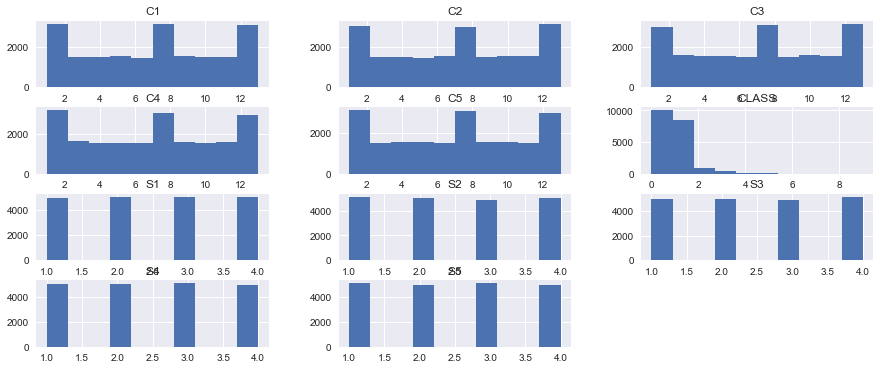

In [134]:
data.hist()
plt.show()

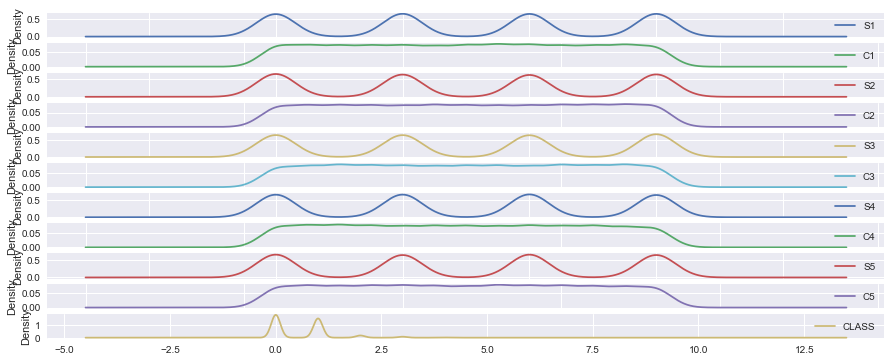

In [135]:
data.plot(kind='density', subplots=True,  sharex=False)
plt.show()

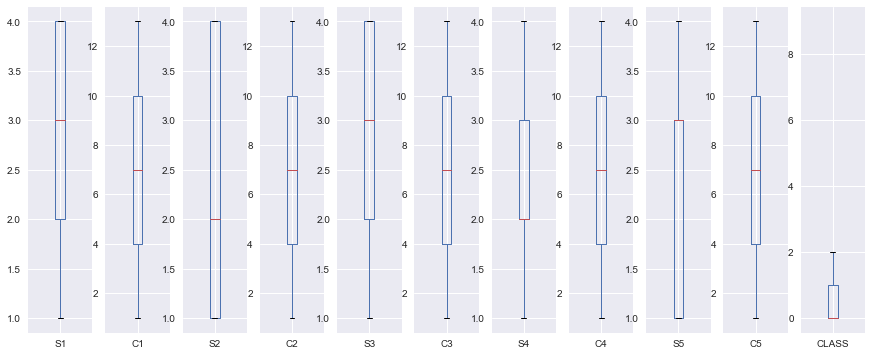

In [136]:
data.plot(kind='box', subplots=True,  sharex=False, sharey=False)
plt.show()

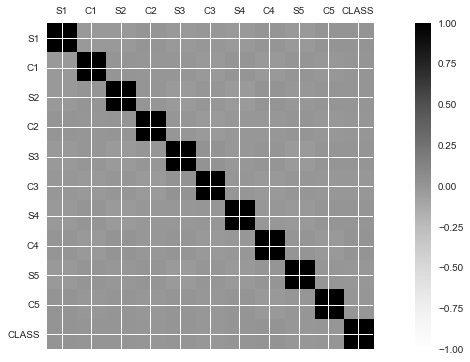

In [137]:
correlations = data.corr()
# plot correlation matrix
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlations, vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = numpy.arange(0,11,1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_xticklabels(names)
ax.set_yticklabels(names)
plt.show()

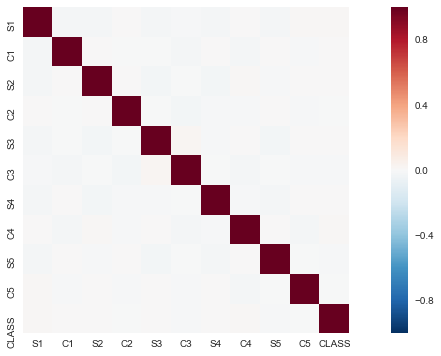

In [138]:
# Encode the categorical features as numbers
def number_encode_features(df):
    result = df.copy()
    encoders = {}
    for column in result.columns:
        if result.dtypes[column] == np.object:
            encoders[column] = preprocessing.LabelEncoder()
            result[column] = encoders[column].fit_transform(result[column])
    return result, encoders

# Calculate the correlation and plot it
encoded_data, _ = number_encode_features(data)
sns.heatmap(encoded_data.corr(), square=True)
plt.show()

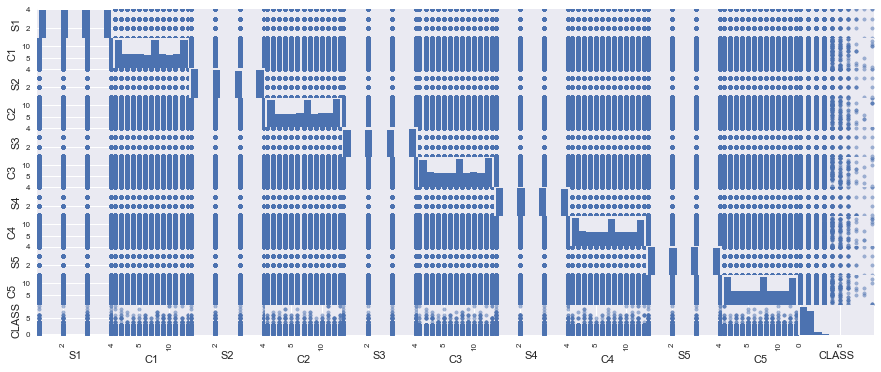

In [139]:
scatter_matrix(data)
plt.show()

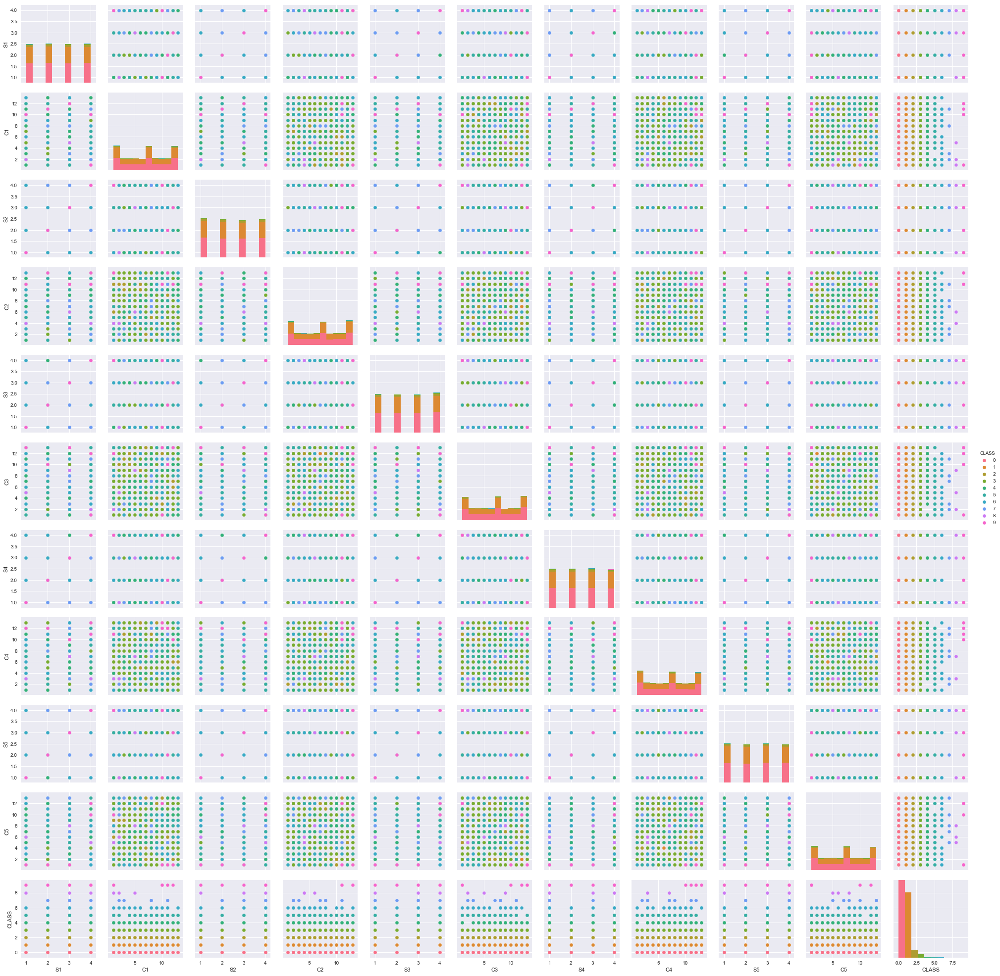

In [140]:
import seaborn as sns
sns.pairplot(data, hue='CLASS')

# Prepare the data for classification

In [141]:
from sklearn import preprocessing
# for training data
dataset = data.values
X = dataset[:,0:10].astype(float)
Y = dataset[:,10]
features = preprocessing.scale(X)
target = Y

In [142]:
# for testing data
datasetTest = test.values
X = datasetTest[:,0:10].astype(float)
Y = datasetTest[:,10]
X_deploy = preprocessing.scale(X)
y_deploy = Y

In [143]:
from sklearn.cross_validation import train_test_split
# Extracting 20% validation data
X_train, X_test, y_train, y_test = train_test_split(
    features, target, test_size=0.20, random_state=17)

print('Number of training examples',len(X_train))
print('Number of validation examples',len(X_test))
print('Number of testing examples',len(X_deploy))


Number of training examples 16000
Number of validation examples 4000
Number of testing examples 1000


In [144]:
from sklearn.cross_validation import StratifiedShuffleSplit

## Preproccing

In [145]:
from sklearn import preprocessing
# normalize the data attributes
X_train = preprocessing.normalize(X_train)
X_test = preprocessing.normalize(X_test)
X_deploy = preprocessing.normalize(X_deploy)
# standardize the data attributes
X_train = preprocessing.scale(X_train)
X_test = preprocessing.scale(X_test)
X_deploy = preprocessing.scale(X_deploy)

# Feature Selection

In [146]:
from sklearn import metrics
from sklearn.ensemble import ExtraTreesClassifier
model = ExtraTreesClassifier()
model.fit(X_train, y_train)
# display the relative importance of each attribute
print(model.feature_importances_)

[ 0.09301541  0.10285453  0.09697411  0.10617424  0.09550962  0.10816911
  0.09552088  0.10379795  0.09351135  0.10447279]


# Building classifiers

## KNN classifier
It turns out that k=5 is the best choose of k on the validation set

In [147]:
from sklearn.neighbors import KNeighborsClassifier
clf_neigh = KNeighborsClassifier(n_neighbors=5)
#Training
start_time = time.time()
clf_neigh.fit(X_train, y_train)
print("The time for training KNN is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_neigh.predict(X_test)
print("\n===================================================================")
print("The accuracy on validation dataset of Knn : \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))

The time for training KNN is  0.014153003692626953 seconds 

The accuracy on validation dataset of Knn : 	 0.51375
             precision    recall  f1-score   support

          0       0.56      0.65      0.60      2061
          1       0.45      0.44      0.44      1638
          2       0.21      0.02      0.04       183
          3       0.00      0.00      0.00        79
          4       0.00      0.00      0.00        22
          5       1.00      0.07      0.13        14
          6       0.00      0.00      0.00         3

avg / total       0.49      0.51      0.49      4000



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


## SVM classifier
### Linear SVM "LinearSVC"
It turns out that C=20 is the best on the validation set

In [148]:
from sklearn.svm import LinearSVC
clf_svm_linear = LinearSVC(C=20.0)
#Training
start_time = time.time()
clf_svm_linear.fit(X_train, y_train)
print("The time for training SVM is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_svm_linear.predict(X_test)
print("\n===================================================================")
print("The accuracy on validation dataset of Linear SVC: \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))

The time for training SVM is  8.936788082122803 seconds 

The accuracy on validation dataset of Linear SVC: 	 0.488
             precision    recall  f1-score   support

          0       0.52      0.68      0.59      2061
          1       0.42      0.34      0.37      1638
          2       0.00      0.00      0.00       183
          3       0.00      0.00      0.00        79
          4       0.00      0.00      0.00        22
          5       0.00      0.00      0.00        14
          6       0.00      0.00      0.00         3

avg / total       0.44      0.49      0.46      4000



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


###  SVM "SVC" with kernel='rbf' 
It turns out that C=5 is the best on the validation set


In [149]:
from sklearn.svm import SVC
clf_svm = SVC(C=5.0, kernel='rbf')
#Training
start_time = time.time()
clf_svm.fit(X_train, y_train)
print("The time for training SVM is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_svm.predict(X_test)
print("\n===================================================================")
print("The accuracy on validation dataset of SVC: \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))

The time for training SVM is  15.569414138793945 seconds 

The accuracy on validation dataset of SVC: 	 0.5495
             precision    recall  f1-score   support

          0       0.59      0.72      0.64      2061
          1       0.49      0.44      0.46      1638
          2       0.00      0.00      0.00       183
          3       0.00      0.00      0.00        79
          4       0.00      0.00      0.00        22
          5       0.00      0.00      0.00        14
          6       0.00      0.00      0.00         3

avg / total       0.50      0.55      0.52      4000



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


## Decsion Tree classifier
### DT with Gini impurity "gini", CART (Classification and Regression Trees)
It turns out that min_samples_split=2 is the best on the validation set

In [150]:
# CART tree
from sklearn.tree import DecisionTreeClassifier
clf_dt = DecisionTreeClassifier(min_samples_split=2)
#Training
start_time = time.time()
clf_dt.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt.predict(X_test)
print("\n===================================================================")
print("The accuracy on validation dataset of DT : \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))


The time for training Decision Tree is  0.3846769332885742 seconds 

The accuracy on validation dataset of DT : 	 0.46725
             precision    recall  f1-score   support

          0       0.58      0.53      0.55      2061
          1       0.44      0.46      0.45      1638
          2       0.05      0.07      0.06       183
          3       0.05      0.06      0.06        79
          4       0.09      0.05      0.06        22
          5       0.00      0.00      0.00        14
          6       0.00      0.00      0.00         3
          7       0.00      0.00      0.00         0
          8       0.00      0.00      0.00         0
          9       0.00      0.00      0.00         0

avg / total       0.48      0.47      0.47      4000



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/metrics/classification.py:1115: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


### DT with “entropy” for the information gain, C4.5 (aka J48 is an open source Java Weka) and C5.0
It turns out that min_samples_split=2 is the best on the validation set

In [151]:
# Here I use C5.0 tree as its more accurate that C4.5 and more recent.
from sklearn.tree import DecisionTreeClassifier
clf_dt_IG = DecisionTreeClassifier(criterion='entropy', min_samples_split=2)
#Training
start_time = time.time()
clf_dt_IG.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_IG.predict(X_test)
print("\n===================================================================")
print("The accuracy on validation dataset of DT : \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))


The time for training Decision Tree is  0.793752908706665 seconds 

The accuracy on validation dataset of DT : 	 0.4765
             precision    recall  f1-score   support

          0       0.58      0.55      0.57      2061
          1       0.44      0.46      0.45      1638
          2       0.06      0.07      0.06       183
          3       0.05      0.05      0.05        79
          4       0.00      0.00      0.00        22
          5       0.00      0.00      0.00        14
          6       0.00      0.00      0.00         3
          7       0.00      0.00      0.00         0
          8       0.00      0.00      0.00         0
          9       0.00      0.00      0.00         0

avg / total       0.49      0.48      0.48      4000



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/metrics/classification.py:1115: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


 Ensemble methods

## Bagging Method


### Bagging Method with Knn


Using Best KNN classifier fitted the data, each built on random subsets of 50% of the samples and 50% of the features.

In [152]:
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
clf_dt_BGKN = BaggingClassifier(KNeighborsClassifier(n_neighbors=5),
                             max_samples=0.5, max_features=0.5)
start_time = time.time()
clf_dt_BGKN.fit(X_train, y_train)
print("The time for training Bagging Knn is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_BGKN.predict(X_test)
print("\n===================================================================")
print("The accuracy on validation dataset of Bagging_knn: \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))


The time for training Bagging Knn is  0.06441688537597656 seconds 

The accuracy on validation dataset of Bagging_knn: 	 0.53075
             precision    recall  f1-score   support

          0       0.56      0.73      0.63      2061
          1       0.47      0.38      0.42      1638
          2       0.00      0.00      0.00       183
          3       0.00      0.00      0.00        79
          4       0.00      0.00      0.00        22
          5       0.00      0.00      0.00        14
          6       0.00      0.00      0.00         3

avg / total       0.48      0.53      0.50      4000



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### Bagging Method with DT


Using Best DT with 'entropy', each built on random subsets of 50% of the samples and 50% of the features.

In [153]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
clf_dt_BGDT = BaggingClassifier(DecisionTreeClassifier(criterion='entropy', min_samples_split=2),
                             max_samples=0.5, max_features=0.5)
start_time = time.time()
clf_dt_BGDT.fit(X_train, y_train)
print("The time for training Bagging DT is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_BGDT.predict(X_test)
print("\n===================================================================")
print("The accuracy on validation dataset of Bagging_DT: \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))


The time for training Bagging DT is  1.2421109676361084 seconds 

The accuracy on validation dataset of Bagging_DT: 	 0.51325
             precision    recall  f1-score   support

          0       0.55      0.70      0.61      2061
          1       0.45      0.38      0.41      1638
          2       0.20      0.01      0.01       183
          3       0.00      0.00      0.00        79
          4       0.00      0.00      0.00        22
          5       0.00      0.00      0.00        14
          6       0.00      0.00      0.00         3

avg / total       0.48      0.51      0.48      4000



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


## Random Forest
DT with 'gini'

In [154]:
from sklearn.ensemble import RandomForestClassifier
clf_dt_RF = RandomForestClassifier()
#Training
start_time = time.time()
clf_dt_RF.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_RF.predict(X_test)
print("\n===================================================================")
print("The accuracy on validation dataset of RF : \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))


The time for training Decision Tree is  0.7042109966278076 seconds 

The accuracy on validation dataset of RF : 	 0.5445
             precision    recall  f1-score   support

          0       0.58      0.71      0.64      2061
          1       0.48      0.43      0.45      1638
          2       0.19      0.02      0.03       183
          3       0.00      0.00      0.00        79
          4       0.00      0.00      0.00        22
          5       0.00      0.00      0.00        14
          6       0.00      0.00      0.00         3

avg / total       0.51      0.54      0.52      4000



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### Ada Boost
DT with 'gini'

In [155]:
from sklearn.ensemble import AdaBoostClassifier
clf_dt_AD = AdaBoostClassifier()
#Training
start_time = time.time()
clf_dt_AD.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_AD.predict(X_test)
print("\n===================================================================")
print("The accuracy on validation dataset of Ada boost : \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))


The time for training Decision Tree is  1.192559003829956 seconds 

The accuracy on validation dataset of Ada boost : 	 0.518
             precision    recall  f1-score   support

          0       0.52      0.99      0.68      2061
          1       0.67      0.02      0.04      1638
          2       0.00      0.00      0.00       183
          3       0.00      0.00      0.00        79
          4       0.00      0.00      0.00        22
          5       0.00      0.00      0.00        14
          6       0.00      0.00      0.00         3
          7       0.00      0.00      0.00         0

avg / total       0.54      0.52      0.37      4000



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/metrics/classification.py:1115: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


## Naive Bayes methods

In [156]:
from sklearn.naive_bayes import GaussianNB
clf_NB = GaussianNB()
#Training
start_time = time.time()
clf_NB.fit(X_train, y_train)
print("The time for training Naive Bayes is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_NB.predict(X_test)
print("\n===================================================================")
print("The accuracy on validation dataset of NB: \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))


The time for training Naive Bayes is  0.005725860595703125 seconds 

The accuracy on validation dataset of NB: 	 0.5155
             precision    recall  f1-score   support

          0       0.52      1.00      0.68      2061
          1       0.40      0.00      0.00      1638
          2       0.00      0.00      0.00       183
          3       0.00      0.00      0.00        79
          4       0.00      0.00      0.00        22
          5       0.00      0.00      0.00        14
          6       0.00      0.00      0.00         3

avg / total       0.43      0.52      0.35      4000



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


## Linear Discriminant Analysis classifier

In [157]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
clf_dt_LDA = LinearDiscriminantAnalysis()
#Training
start_time = time.time()
clf_dt_LDA.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_LDA.predict(X_test)
print("\n===================================================================")
print("The accuracy on validation dataset of LDA: \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))


The time for training Decision Tree is  0.01201319694519043 seconds 

The accuracy on validation dataset of LDA: 	 0.51525
             precision    recall  f1-score   support

          0       0.52      1.00      0.68      2061
          1       0.00      0.00      0.00      1638
          2       0.00      0.00      0.00       183
          3       0.00      0.00      0.00        79
          4       0.00      0.00      0.00        22
          5       0.00      0.00      0.00        14
          6       0.00      0.00      0.00         3

avg / total       0.27      0.52      0.35      4000



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


## Quadratic Discriminant Analysis classifier

In [158]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
clf_dt_QDA = QuadraticDiscriminantAnalysis()
#Training
start_time = time.time()
clf_dt_QDA.fit(X_train, y_train)
print("The time for training Decision Tree is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = clf_dt_QDA.predict(X_test)
print("\n===================================================================")
print("The accuracy on validation dataset of QDA : \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))

The time for training Decision Tree is  0.007445812225341797 seconds 

The accuracy on validation dataset of QDA : 	 0.55725
             precision    recall  f1-score   support

          0       0.58      0.80      0.67      2061
          1       0.51      0.35      0.42      1638
          2       0.00      0.00      0.00       183
          3       0.00      0.00      0.00        79
          4       0.00      0.00      0.00        22
          5       0.00      0.00      0.00        14
          6       0.00      0.00      0.00         3

avg / total       0.51      0.56      0.52      4000



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:695: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


## Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
LogReg = LogisticRegression(C=1e5)
#Training
start_time = time.time()
LogReg.fit(X_train, y_train)
print("The time for training LDA is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = LogReg.predict(X_test)


print("\n===================================================================")
print("The accuracy on validation dataset of Logistic Regression : \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))


The time for training LDA is  0.20647883415222168 seconds 

The accuracy on validation dataset of Logistic Regression : 	 0.51525
             precision    recall  f1-score   support

          0       0.52      1.00      0.68      2061
          1       0.00      0.00      0.00      1638
          2       0.00      0.00      0.00       183
          3       0.00      0.00      0.00        79
          4       0.00      0.00      0.00        22
          5       0.00      0.00      0.00        14
          6       0.00      0.00      0.00         3

avg / total       0.27      0.52      0.35      4000



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


## Gaussian Process Classifier

In [ ]:
from sklearn.gaussian_process import GaussianProcessClassifier
GP = GaussianProcessClassifier()
#Training
start_time = time.time()
GP.fit(X_train, y_train)
print("The time for training GB is  %s seconds " % (time.time() - start_time))

# Make a prediction
y_pred = GP.predict(X_test)

print("\n===================================================================")
print("The accuracy on validation dataset of Gaussian Process Classifier : \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))

## LightGBM, Light Gradient Boosting Machine

In [ ]:
import lightgbm as lgb
lgb_train = lgb.Dataset(X_train, y_train)
gbm = lgb.LGBMClassifier()
gbm.fit(X_train, y_train, eval_metric="multi_logloss")
y_pred = gbm.predict(X_test)

print("\n===================================================================")
print("The accuracy on validation dataset of LightGBM : \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))

## XGBoost, eXtreme Gradient Boosting

In [ ]:
import xgboost as xgb
XG_Boost = xgb.XGBClassifier(max_depth=3, n_estimators=300, learning_rate=0.05).fit(X_train, y_train)
y_pred = XG_Boost.predict(X_test)

print("\n===================================================================")
print("The accuracy on validation dataset of XGBoost : \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))

## Neural Networks  classifier

In [ ]:
import seaborn as sns
import numpy as np
from sklearn.cross_validation import train_test_split
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.regularizers import l2

from keras.utils import np_utils

labelsTrain = np_utils.to_categorical(y_train)
labelsTest = np_utils.to_categorical(y_test)                                              
model = Sequential()
model.add(Dense(25,
                input_shape=(6,), 
                activation="relu",
                W_regularizer=l2(0.001)))
#model.add(Dropout(0.5))
model.add(Dense(5, activation="softmax"))

model.compile(loss='categorical_crossentropy',
              metrics=['accuracy'],
              optimizer='adam')
# Actual modelling
start_time = time.time()
model.fit(X_train, labelsTrain, verbose=0, batch_size=6, nb_epoch=100)
print("The time for training NN is  %s seconds " % (time.time() - start_time))
score, accuracy = model.evaluate(X_test, labelsTest, batch_size=6, verbose=0)
print("Test fraction correct (NN-Score) = {:.2f}".format(score))
print("Test fraction correct (NN-Accuracy) = {:.2f}".format(accuracy))

In [ ]:
y_pred = model.predict_classes(X_test)
print("===================================================================")
print("The accuracy on validation dataset of Neural Network: \t", metrics.accuracy_score(y_test, y_pred))
print("===================================================================")
print(metrics.classification_report(y_test, y_pred, target_names=['0' , '1' , '2' , '3' , '4' , '5' , '6' , '7' , '8' , '9']))


In [ ]:
path = './poker/'
sys.path.append("./poker")
model.save_weights('pokerModelbest.hdf5',overwrite=True)

In [ ]:
np.save('./poker/X_train', X_train)
np.save('./poker/y_train', y_train)
np.save('./poker/X_test', X_test)
np.save('./poker/y_test', y_test)
np.save('./poker/X_deploy', X_deploy)
np.save('./poker/y_deploy', y_deploy)